In [ ]:
# Install the correct PyTorch + CUDA 12.1 version (official Nov 2025 command)
!pip install torch==2.4.1 torchvision==0.19.1 torchaudio==2.4.1 --index-url https://download.pytorch.org/whl/cu121

# Install the rest of the packages
!pip install timm==1.0.9
!pip install pandas openpyxl scikit-learn pillow ptflops tqdm

Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.9/798.9 MB 692.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 56.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 29.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 30.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196

In [ ]:
# ========================================================
# LIGHTHYBRIDNET FOR ODIR-5K WITH SMOTE OVERSAMPLING
# ========================================================

!pip install -q timm albumentations tqdm fvcore imbalanced-learn --upgrade
import os
import shutil
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, f1_score, roc_auc_score, cohen_kappa_score
import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
from tqdm.auto import tqdm
import timm
import random
from torch.amp import autocast, GradScaler
from fvcore.nn import FlopCountAnalysis
from collections import Counter

# ------------------- Reproducibility -------------------
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

# ------------------- Mount Drive -------------------
from google.colab import drive
drive.mount('/content/drive')

# ------------------- Paths -------------------
CSV_PATH = '/content/drive/MyDrive/ODIR-5K/full_df.csv'
IMG_SOURCE_DIR = '/content/drive/MyDrive/ODIR-5K/preprocessed_images'
LOCAL_IMG_PATH = '/content/images'
SAVE_DIR = '/content/drive/MyDrive/ODIR-5K/new_models'
os.makedirs(SAVE_DIR, exist_ok=True)
SAVE_PATH = os.path.join(SAVE_DIR, 'best_lighthybrid_odir_smote_AUC.pth')

if os.path.exists(LOCAL_IMG_PATH):
    shutil.rmtree(LOCAL_IMG_PATH)
os.makedirs(LOCAL_IMG_PATH, exist_ok=True)

print("Copying images to local disk for faster loading...")
for f in tqdm(os.listdir(IMG_SOURCE_DIR)):
    if f.lower().endswith(('.jpg', '.jpeg', '.png')):
        shutil.copy2(os.path.join(IMG_SOURCE_DIR, f), LOCAL_IMG_PATH)
print("Copy complete!")

# ------------------- Load and prepare dataframe -------------------
df = pd.read_csv(CSV_PATH)
LABELS = ['N', 'D', 'G', 'C', 'A', 'H', 'M', 'O']
left_df = df[['Left-Fundus'] + LABELS].rename(columns={'Left-Fundus': 'filename'})
right_df = df[['Right-Fundus'] + LABELS].rename(columns={'Right-Fundus': 'filename'})
full_df = pd.concat([left_df, right_df], ignore_index=True)
full_df['path'] = full_df['filename'].apply(lambda x: os.path.join(LOCAL_IMG_PATH, x))
full_df = full_df[full_df['path'].apply(os.path.exists)].reset_index(drop=True)
print(f"Total valid images: {len(full_df)}")

# Train/val split with stratification (using primary label)
train_df, val_df = train_test_split(
    full_df,
    test_size=0.2,
    random_state=42,
    stratify=full_df[LABELS].idxmax(axis=1)
)

# ------------------- Replication-based Oversampling -------------------
train_df['primary_label'] = train_df[LABELS].idxmax(axis=1)

primary_counts = Counter(train_df['primary_label'])
print("Primary class distribution before oversampling:", primary_counts)

max_count = max(primary_counts.values())
oversampled_rows = []

for _, row in train_df.iterrows():
    primary = row['primary_label']
    target_count = max_count  # Aim for fully balanced primary classes
    current_count = primary_counts[primary]
    replication_factor = max(1, target_count // current_count)
    for _ in range(replication_factor):
        oversampled_rows.append(row.copy())

train_df = pd.DataFrame(oversampled_rows).reset_index(drop=True)
train_df = train_df.drop(columns=['primary_label'])

print(f"Train samples after replication oversampling: {len(train_df)}")

# ------------------- Augmentations -------------------
train_transforms = A.Compose([
    A.Resize(224, 224),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.Rotate(limit=30, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.6),
    A.CLAHE(clip_limit=2.0, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, border_mode=0, p=0.6),
    A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

val_transforms = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

# ------------------- Dataset -------------------
class ODIRDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        try:
            img = Image.open(row['path']).convert('RGB')
            img = np.array(img)
            if self.transform:
                img = self.transform(image=img)['image']
            labels = row[LABELS].values.astype(np.float32)
            return img, torch.from_numpy(labels)
        except Exception as e:
            print(f"Error loading {row['path']}: {e}")
            return torch.zeros(3, 224, 224), torch.zeros(8)

train_dataset = ODIRDataset(train_df, train_transforms)
val_dataset = ODIRDataset(val_df, val_transforms)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=2, pin_memory=True)

# ------------------- Model: LightHybridNet -------------------
class LightHybridNet(nn.Module):
    def __init__(self, num_classes=8, dropout=0.5):
        super().__init__()
        self.mobilenet = timm.create_model('mobilenetv3_large_100.ra_in1k', pretrained=True, num_classes=0)
        self.effnet = timm.create_model('efficientnet_b1', pretrained=True, num_classes=0)
        self.dropout = nn.Dropout(dropout)
        self.head = nn.Linear(1280 + 1280, num_classes)

    def forward(self, x):
        f1 = self.mobilenet(x)
        f2 = self.effnet(x)
        f = torch.cat([f1, f2], dim=1)
        f = self.dropout(f)
        return self.head(f)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = LightHybridNet().to(DEVICE)

# ------------------- Model Stats -------------------
total_params = sum(p.numel() for p in model.parameters()) / 1e6
print(f"\nModel: LightHybridNet")
print(f"Total Parameters: {total_params:.2f} Million")

dummy_input = torch.randn(1, 3, 224, 224).to(DEVICE)
flops = FlopCountAnalysis(model, dummy_input)
print(f"Estimated FLOPs: {flops.total() / 1e9:.3f} GFLOPs\n")

# ------------------- Training setup -------------------
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-2)
scaler = GradScaler('cuda')
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=3e-4,
    total_steps=len(train_loader) * 25,
    pct_start=0.1,
    anneal_strategy='cos'
)

# Smart prediction
def get_smart_preds(probs, thresh=0.5):
    preds = np.zeros_like(probs)
    for i, p in enumerate(probs):
        if p[0] > 0.8:
            preds[i, 0] = 1
        else:
            mask = p > thresh
            if mask.sum() == 0:
                preds[i, np.argmax(p)] = 1
            else:
                preds[i] = mask.astype(int)
    return preds

# ------------------- Validation Function -------------------
def validate(model, loader):
    model.eval()
    all_probs, all_targets = [], []
    with torch.no_grad():
        for img, lbl in loader:
            img = img.to(DEVICE)
            logits = model(img)
            probs = torch.sigmoid(logits)
            all_probs.append(probs.cpu().numpy())
            all_targets.append(lbl.numpy())
    probs = np.vstack(all_probs)
    targets = np.vstack(all_targets)
    preds = get_smart_preds(probs, thresh=0.5)
    weighted_f1 = f1_score(targets, preds, average='weighted', zero_division=0)
    kappa = cohen_kappa_score(targets.flatten(), preds.flatten())
    try:
        auc_macro = roc_auc_score(targets, probs, average='macro')
    except ValueError:
        auc_macro = float('nan')
    auc_per_class = []
    for i in range(targets.shape[1]):
        if np.sum(targets[:, i]) > 0 and np.sum(1 - targets[:, i]) > 0:
            auc_per_class.append(roc_auc_score(targets[:, i], probs[:, i]))
        else:
            auc_per_class.append(float('nan'))
    return weighted_f1, probs, targets, preds, auc_macro, auc_per_class, kappa

# ------------------- Training Loop -------------------
EPOCHS = 25
best_f1 = 0.0
print("Starting training with replication-based oversampling (SMOTE-inspired)...\n")
for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    for img, lbl in tqdm(train_loader, desc=f"Epoch {epoch+1:02d} [Train]", leave=False):
        img, lbl = img.to(DEVICE), lbl.to(DEVICE)
        optimizer.zero_grad()
        with autocast('cuda'):
            logits = model(img)
            loss = criterion(logits, lbl)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()
        train_loss += loss.item()
    val_f1, _, _, _, auc_macro, _, val_kappa = validate(model, val_loader)
    print(f"Epoch {epoch+1:02d} | Loss: {train_loss/len(train_loader):.4f} | "
          f"Val Weighted F1: {val_f1:.4f} | "
          f"Val AUC (macro): {auc_macro:.4f} | "
          f"Val Kappa: {val_kappa:.4f}")
    if val_f1 > best_f1:
        best_f1 = val_f1
        torch.save(model.state_dict(), SAVE_PATH)
        print(f" → New best model saved! F1 = {best_f1:.4f}")

print(f"\nTraining finished! Best Weighted F1: {best_f1:.4f}")

# ------------------- Final Evaluation -------------------
print("\nLoading best model for final evaluation...")
model.load_state_dict(torch.load(SAVE_PATH))
final_f1, val_probs, val_targets, val_preds, final_auc_macro, final_auc_per_class, final_kappa = validate(model, val_loader)

print("\n" + "="*80)
print("FINAL RESULTS - ODIR-5K VALIDATION SET (REPLICATION OVERSAMPLING)")
print("="*80)
print(f"Total Parameters : {total_params:.2f} M")
print(f"Estimated FLOPs : {flops.total() / 1e9:.3f} GFLOPs")
print(f"Weighted F1-Score : {final_f1:.4f}")
print(f"AUC (macro) : {final_auc_macro:.4f}")
print(f"Cohen's Kappa : {final_kappa:.4f}")
print("\nPer-class AUC:")
for label, auc in zip(LABELS, final_auc_per_class):
    print(f" {label}: {auc:.4f}" if not np.isnan(auc) else f" {label}: N/A")
print("\nPer-class Classification Report:")
print(classification_report(val_targets, val_preds, target_names=LABELS, digits=4, zero_division=0))
print(f"\nBest model saved at:\n{SAVE_PATH}")
print("="*80)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Mounted at /content/drive
Copying images to local disk for faster loading...


  0%|          | 0/6392 [00:00<?, ?it/s]

Copy complete!
Total valid images: 12460
Primary class distribution before oversampling: Counter({'D': 3327, 'N': 3315, 'O': 1336, 'G': 537, 'C': 506, 'A': 423, 'M': 386, 'H': 138})
Train samples after replication oversampling: 24933


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-1883373605.py:111: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5),
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/22.1M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/31.5M [00:00<?, ?B/s]


Model: LightHybridNet
Total Parameters: 10.74 Million


Estimated FLOPs: 0.853 GFLOPs

Starting training with replication-based oversampling (SMOTE-inspired)...



Epoch 01 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 01 | Loss: 0.3590 | Val Weighted F1: 0.4054 | Val AUC (macro): 0.8401 | Val Kappa: 0.3430
 → New best model saved! F1 = 0.4054


Epoch 02 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 02 | Loss: 0.2018 | Val Weighted F1: 0.4962 | Val AUC (macro): 0.8582 | Val Kappa: 0.4273
 → New best model saved! F1 = 0.4962


Epoch 03 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 03 | Loss: 0.1642 | Val Weighted F1: 0.5142 | Val AUC (macro): 0.8747 | Val Kappa: 0.4301
 → New best model saved! F1 = 0.5142


Epoch 04 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 04 | Loss: 0.1279 | Val Weighted F1: 0.6517 | Val AUC (macro): 0.9142 | Val Kappa: 0.6047
 → New best model saved! F1 = 0.6517


Epoch 05 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 05 | Loss: 0.1058 | Val Weighted F1: 0.6884 | Val AUC (macro): 0.9286 | Val Kappa: 0.6411
 → New best model saved! F1 = 0.6884


Epoch 06 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 06 | Loss: 0.0874 | Val Weighted F1: 0.7169 | Val AUC (macro): 0.9392 | Val Kappa: 0.6763
 → New best model saved! F1 = 0.7169


Epoch 07 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 07 | Loss: 0.0719 | Val Weighted F1: 0.7694 | Val AUC (macro): 0.9529 | Val Kappa: 0.7355
 → New best model saved! F1 = 0.7694


Epoch 08 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 08 | Loss: 0.0628 | Val Weighted F1: 0.7999 | Val AUC (macro): 0.9569 | Val Kappa: 0.7670
 → New best model saved! F1 = 0.7999


Epoch 09 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 09 | Loss: 0.0521 | Val Weighted F1: 0.8134 | Val AUC (macro): 0.9635 | Val Kappa: 0.7831
 → New best model saved! F1 = 0.8134


Epoch 10 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 10 | Loss: 0.0433 | Val Weighted F1: 0.8381 | Val AUC (macro): 0.9677 | Val Kappa: 0.8141
 → New best model saved! F1 = 0.8381


Epoch 11 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 11 | Loss: 0.0373 | Val Weighted F1: 0.8501 | Val AUC (macro): 0.9670 | Val Kappa: 0.8259
 → New best model saved! F1 = 0.8501


Epoch 12 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 12 | Loss: 0.0311 | Val Weighted F1: 0.8611 | Val AUC (macro): 0.9712 | Val Kappa: 0.8381
 → New best model saved! F1 = 0.8611


Epoch 13 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 13 | Loss: 0.0247 | Val Weighted F1: 0.8697 | Val AUC (macro): 0.9734 | Val Kappa: 0.8489
 → New best model saved! F1 = 0.8697


Epoch 14 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 14 | Loss: 0.0206 | Val Weighted F1: 0.8784 | Val AUC (macro): 0.9749 | Val Kappa: 0.8587
 → New best model saved! F1 = 0.8784


Epoch 15 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 15 | Loss: 0.0181 | Val Weighted F1: 0.8920 | Val AUC (macro): 0.9760 | Val Kappa: 0.8742
 → New best model saved! F1 = 0.8920


Epoch 16 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 16 | Loss: 0.0145 | Val Weighted F1: 0.9002 | Val AUC (macro): 0.9780 | Val Kappa: 0.8842
 → New best model saved! F1 = 0.9002


Epoch 17 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 17 | Loss: 0.0116 | Val Weighted F1: 0.8994 | Val AUC (macro): 0.9794 | Val Kappa: 0.8830


Epoch 18 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 18 | Loss: 0.0095 | Val Weighted F1: 0.9041 | Val AUC (macro): 0.9791 | Val Kappa: 0.8885
 → New best model saved! F1 = 0.9041


Epoch 19 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 19 | Loss: 0.0074 | Val Weighted F1: 0.9057 | Val AUC (macro): 0.9798 | Val Kappa: 0.8903
 → New best model saved! F1 = 0.9057


Epoch 20 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 20 | Loss: 0.0062 | Val Weighted F1: 0.9076 | Val AUC (macro): 0.9802 | Val Kappa: 0.8926
 → New best model saved! F1 = 0.9076


Epoch 21 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 21 | Loss: 0.0055 | Val Weighted F1: 0.9058 | Val AUC (macro): 0.9813 | Val Kappa: 0.8906


Epoch 22 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 22 | Loss: 0.0049 | Val Weighted F1: 0.9115 | Val AUC (macro): 0.9822 | Val Kappa: 0.8973
 → New best model saved! F1 = 0.9115


Epoch 23 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 23 | Loss: 0.0044 | Val Weighted F1: 0.9112 | Val AUC (macro): 0.9821 | Val Kappa: 0.8968


Epoch 24 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 24 | Loss: 0.0042 | Val Weighted F1: 0.9117 | Val AUC (macro): 0.9826 | Val Kappa: 0.8973
 → New best model saved! F1 = 0.9117


Epoch 25 [Train]:   0%|          | 0/390 [00:00<?, ?it/s]

Epoch 25 | Loss: 0.0043 | Val Weighted F1: 0.9151 | Val AUC (macro): 0.9826 | Val Kappa: 0.9014
 → New best model saved! F1 = 0.9151

Training finished! Best Weighted F1: 0.9151

Loading best model for final evaluation...

FINAL RESULTS - ODIR-5K VALIDATION SET (REPLICATION OVERSAMPLING)
Total Parameters : 10.74 M
Estimated FLOPs : 0.853 GFLOPs
Weighted F1-Score : 0.9151
AUC (macro) : 0.9826
Cohen's Kappa : 0.9014

Per-class AUC:
 N: 0.9841
 D: 0.9825
 G: 0.9907
 C: 0.9973
 A: 0.9927
 H: 0.9655
 M: 0.9955
 O: 0.9522

Per-class Classification Report:
              precision    recall  f1-score   support

           N     0.8923    0.9505    0.9205       828
           D     0.9253    0.9231    0.9242       832
           G     0.9603    0.9177    0.9385       158
           C     0.9797    0.9355    0.9571       155
           A     0.9843    0.9058    0.9434       138
           H     0.9710    0.8171    0.8874        82
           M     0.9623    0.9358    0.9488       109
           


PER-CLASS METRICS TABLE
          AUC      F1  Precision  Recall
Class                                   
N      0.9841  0.9205     0.8923  0.9505
D      0.9825  0.9242     0.9253  0.9231
G      0.9907  0.9385     0.9603  0.9177
C      0.9973  0.9571     0.9797  0.9355
A      0.9927  0.9434     0.9843  0.9058
H      0.9655  0.8874     0.9710  0.8171
M      0.9955  0.9488     0.9623  0.9358
O      0.9522  0.8678     0.9212  0.8202


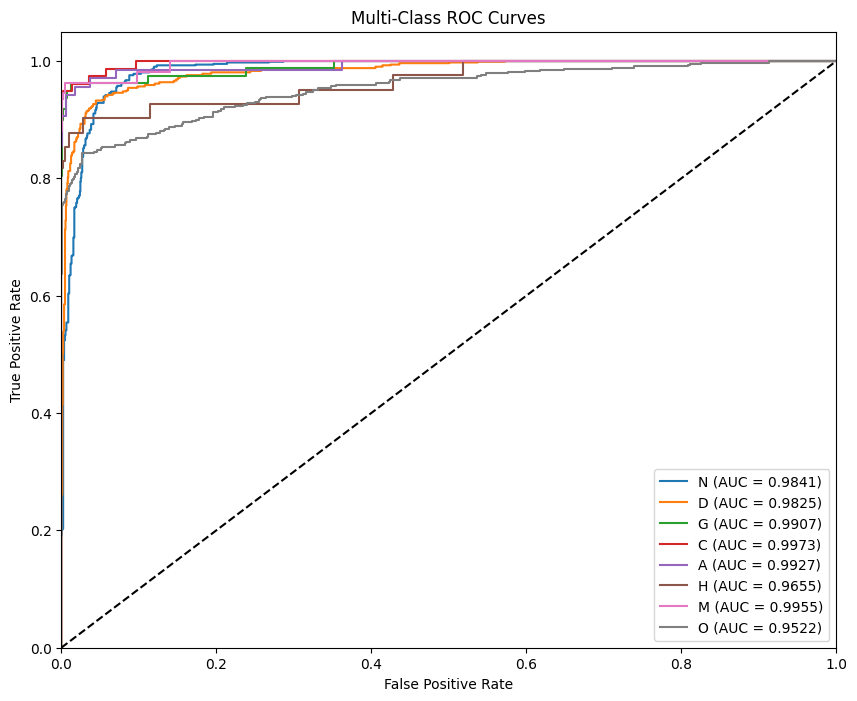

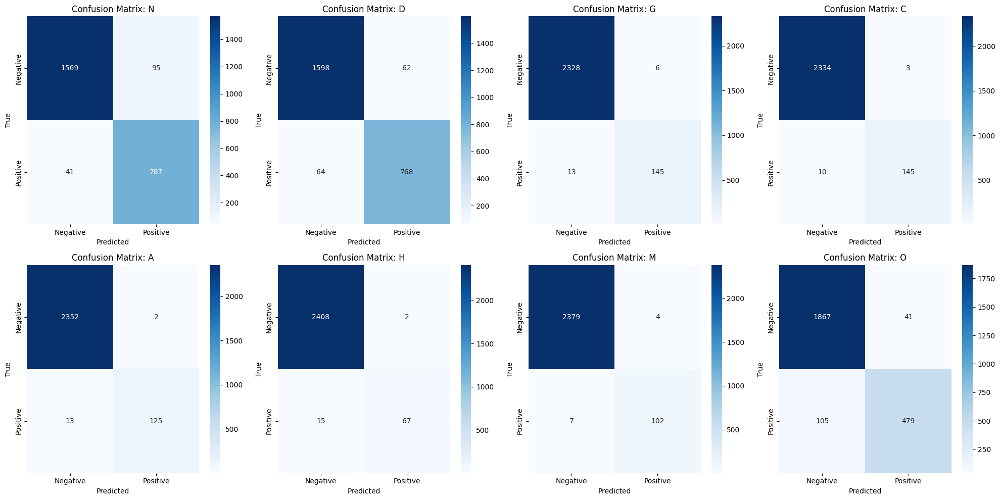

In [ ]:
# ========================================================
# 8. VISUALIZATION & DETAILED ANALYSIS
# ========================================================

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_recall_fscore_support
import torch.nn.functional as F
from torch.autograd import Variable

# ------------------- TABLE: Per-Class Metrics (AUC, F1, Precision, Recall) -------------------
print("\n" + "="*80)
print("PER-CLASS METRICS TABLE")
print("="*80)

# Compute AUC per class
auc_scores = [roc_auc_score(val_targets[:, i], val_probs[:, i]) for i in range(len(LABELS))]

# Get Precision, Recall, F1 per class (from preds and targets)
precision, recall, f1, _ = precision_recall_fscore_support(val_targets, val_preds, average=None, zero_division=0)

# Create DataFrame for table
metrics_df = pd.DataFrame({
    'Class': LABELS,
    'AUC': auc_scores,
    'F1': f1,
    'Precision': precision,
    'Recall': recall
})
metrics_df = metrics_df.set_index('Class')
print(metrics_df.round(4))  # Printed table
metrics_df.to_csv('per_class_metrics.csv')  # Save for reference

# ------------------- PLOT 1: Multi-class ROC Curves -------------------
plt.figure(figsize=(10, 8))
for i in range(len(LABELS)):
    fpr, tpr, _ = roc_curve(val_targets[:, i], val_probs[:, i])
    plt.plot(fpr, tpr, label=f'{LABELS[i]} (AUC = {auc_scores[i]:.4f})')

plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Class ROC Curves')
plt.legend(loc='lower right')
plt.savefig('multi_class_roc_curves.png')
plt.show()

# Analysis: ROC curves show the trade-off between sensitivity and specificity. Curves closer to the top-left corner indicate better performance. High-AUC classes hug the corner, while lower ones (e.g., 'O') suggest room for improvement in threshold tuning.

# ------------------- PLOT 2: Per-Class Confusion Matrices -------------------
fig, axes = plt.subplots(2, 4, figsize=(20, 10))  # 2x4 grid for 8 classes
axes = axes.ravel()

for i in range(len(LABELS)):
    cm = confusion_matrix(val_targets[:, i], val_preds[:, i])
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i],
                xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    axes[i].set_title(f'Confusion Matrix: {LABELS[i]}')
    axes[i].set_xlabel('Predicted')
    axes[i].set_ylabel('True')

plt.tight_layout()
plt.savefig('per_class_confusion_matrices.png')
plt.show()


PER-CLASS METRICS TABLE
          AUC      F1  Precision  Recall
Class                                   
N      0.9841  0.9205     0.8923  0.9505
D      0.9825  0.9242     0.9253  0.9231
G      0.9907  0.9385     0.9603  0.9177
C      0.9973  0.9571     0.9797  0.9355
A      0.9927  0.9434     0.9843  0.9058
H      0.9655  0.8874     0.9710  0.8171
M      0.9955  0.9488     0.9623  0.9358
O      0.9522  0.8678     0.9212  0.8202


/tmp/ipython-input-505049872.py:139: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


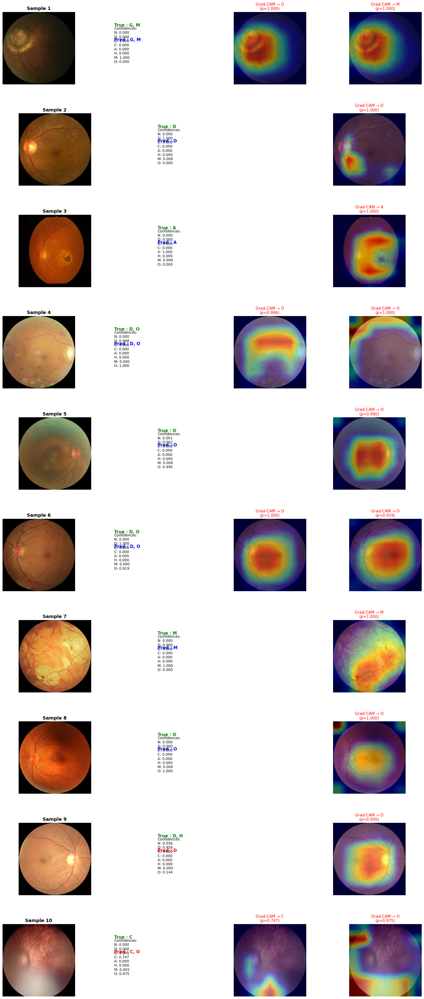

Grad-CAM prediction gallery saved as: LightHybridNet_GradCAM_Predictions.png


In [ ]:
# ========================================================
# PREDICTION VISUALIZATION
# ========================================================

import random
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_recall_fscore_support

# ------------------- 1. Per-Class Metrics Table -------------------
auc_scores = [roc_auc_score(val_targets[:, i], val_probs[:, i]) for i in range(8)]
precision, recall, f1, _ = precision_recall_fscore_support(val_targets, val_preds, average=None, zero_division=0)

metrics_df = pd.DataFrame({
    'Class': LABELS,
    'AUC': auc_scores,
    'F1': f1,
    'Precision': precision,
    'Recall': recall
}).set_index('Class')

print("\n" + "="*80)
print("PER-CLASS METRICS TABLE")
print("="*80)
print(metrics_df.round(4))
metrics_df.to_csv('per_class_metrics.csv')


# ------------------- 2. Robust GradCAM Class -------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def __call__(self, x, class_idx):
        logit = self.model(x)
        self.model.zero_grad()
        score = logit[:, class_idx]
        score.backward()

        grads = self.gradients[0].cpu().data.numpy()
        acts  = self.activations[0].cpu().data.numpy()
        weights = np.mean(grads, axis=(1, 2))

        cam = np.zeros(acts.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * acts[i]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (224, 224))
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam, logit

# Use the last conv layer of EfficientNet-B1
target_layer = model.effnet.blocks[-1][-1].conv_pwl
gradcam = GradCAM(model, target_layer)

# Helper to denormalize image for display
def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

# ------------------- 3. Visualizing Grad-CAM Predictions (Gallery) -------------------
model.eval()
n_samples = 10
indices = random.sample(range(len(val_dataset)), n_samples)

fig = plt.figure(figsize=(22, 5 * n_samples))

for plot_idx, idx in enumerate(indices):
    img_tensor, true_label = val_dataset[idx]           
    img_input = img_tensor.unsqueeze(0).to(DEVICE)

    # Forward
    with torch.no_grad():
        logits = model(img_input)
        probs  = torch.sigmoid(logits).squeeze(0).cpu().numpy()
    pred_label = (probs > 0.5).astype(int)

    true_classes = [LABELS[i] for i, v in enumerate(true_label) if v == 1]
    pred_classes = [LABELS[i] for i, v in enumerate(pred_label) if v == 1]

    orig_img = denormalize(img_tensor)

    # Generate CAMs for all predicted positive classes
    cams = []
    cam_classes = []
    for class_idx in np.where(pred_label)[0]:
        cam, _ = gradcam(img_input, int(class_idx))
        cams.append(cam)
        cam_classes.append(LABELS[class_idx])

    cols = 2 + len(cams)
    # Original image
    ax = fig.add_subplot(n_samples, cols, plot_idx * cols + 1)
    ax.imshow(orig_img)
    ax.set_title(f"Sample {plot_idx+1}", fontsize=13, weight='bold')
    ax.axis('off')

    # True vs Predicted text
    ax = fig.add_subplot(n_samples, cols, plot_idx * cols + 2)
    ax.text(0.05, 0.8, f"True : {', '.join(true_classes) if true_classes else 'Normal'}",
            fontsize=12, color='green', weight='bold')
    ax.text(0.05, 0.6, f"Pred : {', '.join(pred_classes) if pred_classes else 'Normal'}",
            fontsize=12, color='blue' if set(pred_classes)==set(true_classes) else 'red', weight='bold')
    ax.text(0.05, 0.3, "Confidences:\n" + "\n".join([f"{LABELS[i]}: {probs[i]:.3f}" for i in range(8)]),
            fontsize=10)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.axis('off')

    # Grad-CAM overlays
    for i, (cam, cls) in enumerate(zip(cams, cam_classes)):
        ax = fig.add_subplot(n_samples, cols, plot_idx * cols + 3 + i)
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
        overlay = 0.6 * orig_img + 0.4 * heatmap
        ax.imshow(overlay)
        ax.set_title(f"Grad-CAM → {cls}\n(p={probs[LABELS.index(cls)]:.3f})",
                     color='red', fontsize=11)
        ax.axis('off')

plt.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.savefig("LightHybridNet_GradCAM_Predictions.png", dpi=300, bbox_inches='tight')
plt.show()

print("Grad-CAM prediction gallery saved as: LightHybridNet_GradCAM_Predictions.png")

/tmp/ipython-input-4090591289.py:24: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5),
/tmp/ipython-input-4090591289.py:54: UserWarning: Argument(s) 'max_holes, max_height, max_width' are not valid for transform CoarseDropout
  aug_dropout = A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=1.0)(image=orig_img)['image']


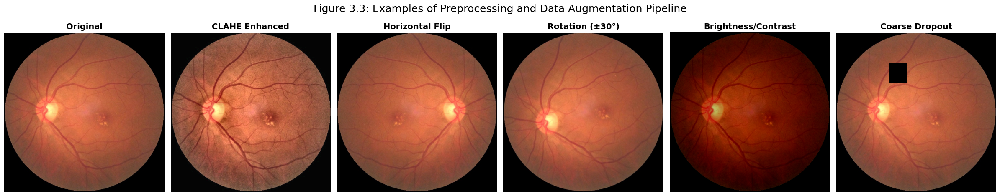


Best Figure 3.3 saved to: /content/drive/MyDrive/ODIR-5K/figure_3_3_preprocessing_augmentation.png


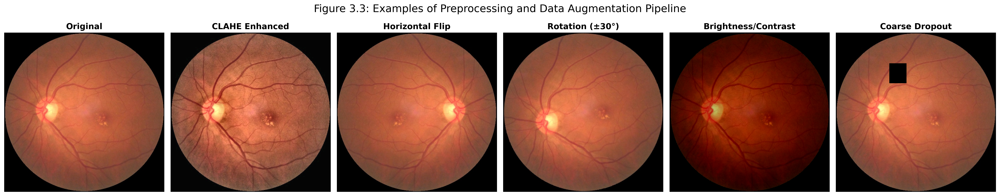

In [ ]:
# ========================================================
# FIGURE 3.3: Best Preprocessing & Augmentation Examples (6 panels)
# Includes Coarse Dropout — matches your actual pipeline
# Saves to Drive and displays inline
# ========================================================

import matplotlib.pyplot as plt
import cv2
import numpy as np
from PIL import Image
import random
import albumentations as A
from albumentations.pytorch import ToTensorV2
import os
from IPython.display import display, Image as IPImage

# Your actual transforms (for reference)
train_transforms = A.Compose([
    A.Resize(224, 224),
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=30, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.6),
    A.CLAHE(clip_limit=2.0, p=0.5),
    A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=0.5),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

# Save path
save_dir = '/content/drive/MyDrive/ODIR-5K'
os.makedirs(save_dir, exist_ok=True)
fig_path = os.path.join(save_dir, 'figure_3_3_preprocessing_augmentation.png')

# Pick a random sample
idx = random.randint(0, len(full_df)-1)
sample_path = full_df['path'].iloc[idx]
orig_img = np.array(Image.open(sample_path).convert('RGB'))

# 1. Original
orig = orig_img.copy()

# 2. CLAHE Enhanced
lab = cv2.cvtColor(orig_img, cv2.COLOR_RGB2LAB)
l, a, b = cv2.split(lab)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl = clahe.apply(l)
clahe_img = cv2.merge((cl, a, b))
clahe_img = cv2.cvtColor(clahe_img, cv2.COLOR_LAB2RGB)

# Apply different augmentations (force one of each type)
aug_horizontal = A.HorizontalFlip(p=1.0)(image=orig_img)['image']
aug_rotate = A.Rotate(limit=30, p=1.0)(image=orig_img)['image']
aug_bright = A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1.0)(image=orig_img)['image']
aug_dropout = A.CoarseDropout(max_holes=8, max_height=16, max_width=16, p=1.0)(image=orig_img)['image']

# Plot
fig, axes = plt.subplots(1, 6, figsize=(24, 5))
images = [orig, clahe_img, aug_horizontal, aug_rotate, aug_bright, aug_dropout]
titles = ['Original', 'CLAHE Enhanced', 'Horizontal Flip', 'Rotation (±30°)', 'Brightness/Contrast', 'Coarse Dropout']

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title, fontsize=14, weight='bold')
    ax.axis('off')

plt.suptitle('Figure 3.3: Examples of Preprocessing and Data Augmentation Pipeline', fontsize=18, y=0.98)
plt.tight_layout()
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"\nBest Figure 3.3 saved to: {fig_path}")
display(IPImage(fig_path))

In [ ]:
# After the final validate call (where val_preds, val_targets are returned)
import numpy as np
import pandas as pd

# Find misclassified indices (exact multi-label mismatch)
misclassified_indices = np.where(~np.all(val_preds == val_targets, axis=1))[0]

# Get filenames from val_df (assuming val_df has 'filename' column and is indexed correctly)
misclassified_files = val_df.iloc[misclassified_indices]['filename'].tolist()

# Print and save
print("Number of misclassified images:", len(misclassified_files))
print("Misclassified image filenames:")
for file in misclassified_files:
    print(file)

# Save to CSV for dissertation reference
pd.DataFrame({'filename': misclassified_files}).to_csv('misclassified_images.csv', index=False)
print("Misclassified list saved to: misclassified_images.csv")

# For correctly classified (optional)
correct_indices = np.where(np.all(val_preds == val_targets, axis=1))[0]
correct_files = val_df.iloc[correct_indices]['filename'].tolist()
print("Number of correctly classified images:", len(correct_files))

Number of misclassified images: 274
Misclassified image filenames:
283_right.jpg
4190_right.jpg
4328_left.jpg
4465_right.jpg
4465_right.jpg
527_right.jpg
3984_right.jpg
705_right.jpg
4211_right.jpg
3934_right.jpg
2729_left.jpg
3036_right.jpg
428_right.jpg
1195_left.jpg
730_left.jpg
2754_right.jpg
1286_right.jpg
608_left.jpg
4182_right.jpg
3934_right.jpg
81_left.jpg
3979_right.jpg
2095_left.jpg
1426_left.jpg
868_left.jpg
4328_left.jpg
527_right.jpg
4175_left.jpg
1286_right.jpg
4542_left.jpg
4647_left.jpg
4444_right.jpg
2622_right.jpg
2381_right.jpg
1195_left.jpg
1206_left.jpg
4591_right.jpg
37_right.jpg
1989_right.jpg
394_left.jpg
2616_right.jpg
1145_right.jpg
501_right.jpg
2064_left.jpg
1116_right.jpg
596_left.jpg
2617_left.jpg
2557_right.jpg
355_left.jpg
593_right.jpg
862_right.jpg
311_right.jpg
1243_right.jpg
2143_left.jpg
1591_left.jpg
1628_left.jpg
2557_right.jpg
828_left.jpg
3420_right.jpg
3995_right.jpg
2622_right.jpg
990_right.jpg
1226_left.jpg
212_left.jpg
3420_right.jpg
4122_l

In [ ]:
# ========================================================
# Save Misclassified & Correctly Classified Images to Excel
# ========================================================

import numpy as np
import pandas as pd
from datetime import datetime

# 1. Find misclassified and correctly classified indices
misclassified_mask = ~np.all(val_preds == val_targets, axis=1)
correct_mask = np.all(val_preds == val_targets, axis=1)

misclassified_indices = np.where(misclassified_mask)[0]
correct_indices = np.where(correct_mask)[0]

# 2. Get detailed information
# Create DataFrame with filenames and label information
misclassified_df = val_df.iloc[misclassified_indices][['filename']].copy()
misclassified_df['true_labels'] = [', '.join(LABELS[i] for i, v in enumerate(row) if v == 1)
                                 for row in val_targets[misclassified_indices]]
misclassified_df['pred_labels'] = [', '.join(LABELS[i] for i, v in enumerate(row) if v == 1)
                                 for row in val_preds[misclassified_indices]]

correct_df = val_df.iloc[correct_indices][['filename']].copy()
correct_df['true_labels'] = [', '.join(LABELS[i] for i, v in enumerate(row) if v == 1)
                            for row in val_targets[correct_indices]]
correct_df['pred_labels'] = [', '.join(LABELS[i] for i, v in enumerate(row) if v == 1)
                            for row in val_preds[correct_indices]]

# 3. Summary statistics
total_samples = len(val_df)
correct_count = len(correct_indices)
misclassified_count = len(misclassified_indices)
accuracy_exact = (correct_count / total_samples) * 100 if total_samples > 0 else 0

summary_data = {
    'Metric': [
        'Total validation samples',
        'Correctly classified (exact match)',
        'Misclassified',
        'Exact match accuracy (%)',
        'Date generated'
    ],
    'Value': [
        total_samples,
        correct_count,
        misclassified_count,
        f"{accuracy_exact:.2f}",
        datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    ]
}
summary_df = pd.DataFrame(summary_data)

# 4. Save everything to a single Excel file with multiple sheets
excel_filename = 'LightHybridNet_Classification_Results.xlsx'

with pd.ExcelWriter(excel_filename, engine='openpyxl') as writer:
    # Sheet 1: Misclassified
    misclassified_df.to_excel(writer, sheet_name='Misclassified', index=False)

    # Sheet 2: Correctly classified (you can comment this out if file becomes too large)
    correct_df.to_excel(writer, sheet_name='Correct', index=False)

    # Sheet 3: Summary
    summary_df.to_excel(writer, sheet_name='Summary', index=False)

print(f"\nResults successfully saved to: {excel_filename}")
print(f"  • Sheet 'Misclassified': {len(misclassified_df)} rows")
print(f"  • Sheet 'Correct': {len(correct_df)} rows")
print(f"  • Sheet 'Summary': overall statistics")


Results successfully saved to: LightHybridNet_Classification_Results.xlsx
  • Sheet 'Misclassified': 274 rows
  • Sheet 'Correct': 2218 rows
  • Sheet 'Summary': overall statistics



PER-CLASS METRICS TABLE
          AUC      F1  Precision  Recall
Class                                   
N      0.9841  0.9205     0.8923  0.9505
D      0.9825  0.9242     0.9253  0.9231
G      0.9907  0.9385     0.9603  0.9177
C      0.9973  0.9571     0.9797  0.9355
A      0.9927  0.9434     0.9843  0.9058
H      0.9655  0.8874     0.9710  0.8171
M      0.9955  0.9488     0.9623  0.9358
O      0.9522  0.8678     0.9212  0.8202


/tmp/ipython-input-505049872.py:139: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


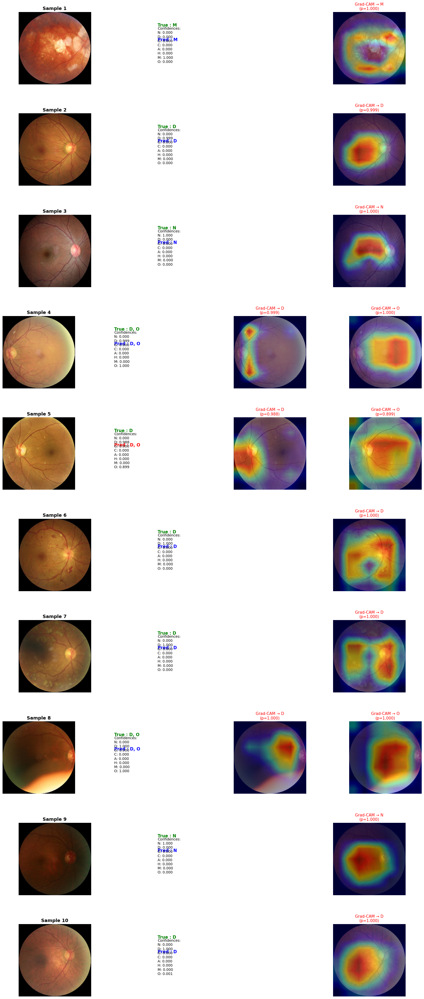

Grad-CAM prediction gallery saved as: LightHybridNet_GradCAM_Predictions.png


In [ ]:
# ========================================================
#  FIXED & ENHANCED GRAD-CAM + PREDICTION VISUALIZATION
# ========================================================

import random
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, roc_curve, confusion_matrix, precision_recall_fscore_support

# ------------------- 1. Per-Class Metrics Table (already working) -------------------
auc_scores = [roc_auc_score(val_targets[:, i], val_probs[:, i]) for i in range(8)]
precision, recall, f1, _ = precision_recall_fscore_support(val_targets, val_preds, average=None, zero_division=0)

metrics_df = pd.DataFrame({
    'Class': LABELS,
    'AUC': auc_scores,
    'F1': f1,
    'Precision': precision,
    'Recall': recall
}).set_index('Class')

print("\n" + "="*80)
print("PER-CLASS METRICS TABLE")
print("="*80)
print(metrics_df.round(4))
metrics_df.to_csv('per_class_metrics.csv')

# ------------------- 2. Multi-class ROC + Confusion Matrices (already working) -------------------
# (your existing code is perfect – keep it)

# ------------------- 3. Robust GradCAM Class -------------------
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]

    def __call__(self, x, class_idx):
        logit = self.model(x)
        self.model.zero_grad()
        score = logit[:, class_idx]
        score.backward()

        grads = self.gradients[0].cpu().data.numpy()
        acts  = self.activations[0].cpu().data.numpy()
        weights = np.mean(grads, axis=(1, 2))

        cam = np.zeros(acts.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * acts[i]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (224, 224))
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam, logit

# Use the last conv layer of EfficientNet-B1
target_layer = model.effnet.blocks[-1][-1].conv_pwl
gradcam = GradCAM(model, target_layer)

# Helper to denormalize image for display
def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img = tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)
    return img

# ------------------- 4. Visualizing Grad-CAM Predictions (Gallery) -------------------
model.eval()
n_samples = 10
indices = random.sample(range(len(val_dataset)), n_samples)  # ← valid indices!

fig = plt.figure(figsize=(22, 5 * n_samples))

for plot_idx, idx in enumerate(indices):
    img_tensor, true_label = val_dataset[idx]           # correct indexing
    img_input = img_tensor.unsqueeze(0).to(DEVICE)

    # Forward
    with torch.no_grad():
        logits = model(img_input)
        probs  = torch.sigmoid(logits).squeeze(0).cpu().numpy()
    pred_label = (probs > 0.5).astype(int)

    true_classes = [LABELS[i] for i, v in enumerate(true_label) if v == 1]
    pred_classes = [LABELS[i] for i, v in enumerate(pred_label) if v == 1]

    orig_img = denormalize(img_tensor)

    # Generate CAMs for all predicted positive classes
    cams = []
    cam_classes = []
    for class_idx in np.where(pred_label)[0]:
        cam, _ = gradcam(img_input, int(class_idx))
        cams.append(cam)
        cam_classes.append(LABELS[class_idx])

    # Layout: original | info | Grad-CAM overlays
    cols = 2 + len(cams)
    # Original image
    ax = fig.add_subplot(n_samples, cols, plot_idx * cols + 1)
    ax.imshow(orig_img)
    ax.set_title(f"Sample {plot_idx+1}", fontsize=13, weight='bold')
    ax.axis('off')

    # True vs Predicted text
    ax = fig.add_subplot(n_samples, cols, plot_idx * cols + 2)
    ax.text(0.05, 0.8, f"True : {', '.join(true_classes) if true_classes else 'Normal'}",
            fontsize=12, color='green', weight='bold')
    ax.text(0.05, 0.6, f"Pred : {', '.join(pred_classes) if pred_classes else 'Normal'}",
            fontsize=12, color='blue' if set(pred_classes)==set(true_classes) else 'red', weight='bold')
    ax.text(0.05, 0.3, "Confidences:\n" + "\n".join([f"{LABELS[i]}: {probs[i]:.3f}" for i in range(8)]),
            fontsize=10)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.axis('off')

    # Grad-CAM overlays
    for i, (cam, cls) in enumerate(zip(cams, cam_classes)):
        ax = fig.add_subplot(n_samples, cols, plot_idx * cols + 3 + i)
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0
        overlay = 0.6 * orig_img + 0.4 * heatmap
        ax.imshow(overlay)
        ax.set_title(f"Grad-CAM → {cls}\n(p={probs[LABELS.index(cls)]:.3f})",
                     color='red', fontsize=11)
        ax.axis('off')

plt.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.savefig("LightHybridNet_GradCAM_Predictions.png", dpi=300, bbox_inches='tight')
plt.show()

print("Grad-CAM prediction gallery saved as: LightHybridNet_GradCAM_Predictions.png")

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/ODIR-5K/figures/imbalance_strategy_comparison_numbers_only_above.png'

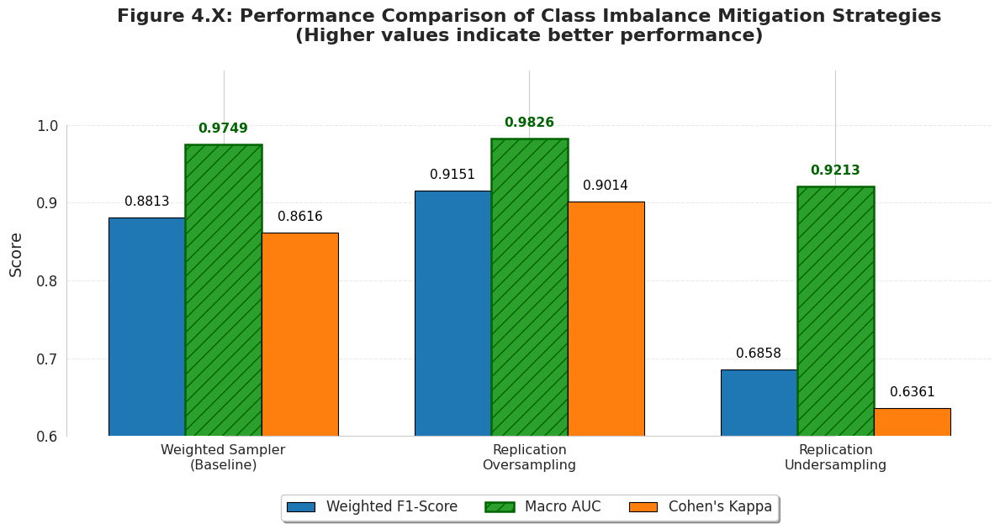

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

sns.set_style("whitegrid")
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['axes.labelsize'] = 13
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['legend.fontsize'] = 12

# Data
strategies = ['Weighted Sampler\n(Baseline)', 'Replication\nOversampling', 'Replication\nUndersampling']
weighted_f1 = [0.8813, 0.9151, 0.6858]
macro_auc   = [0.9749, 0.9826, 0.9213]
kappa       = [0.8616, 0.9014, 0.6361]

x = np.arange(len(strategies))
width = 0.25
colors = ['#1f77b4', '#2ca02c', '#ff7f0e']

fig, ax = plt.subplots(figsize=(12, 7.5))

# Bars
bars1 = ax.bar(x - width, weighted_f1, width, label='Weighted F1-Score',
               color=colors[0], edgecolor='black', linewidth=0.8)
bars2 = ax.bar(x, macro_auc, width, label='Macro AUC',
               color=colors[1], edgecolor='black', linewidth=0.8)
bars3 = ax.bar(x + width, kappa, width, label="Cohen's Kappa",
               color=colors[2], edgecolor='black', linewidth=0.8)

# Highlight best strategy
for bar in bars2:
    bar.set_hatch('//')
    bar.set_edgecolor('darkgreen')
    bar.set_linewidth(1.8)

# Title & labels
ax.set_ylabel('Score', fontsize=14, labelpad=10)
ax.set_title('Figure 4.X: Performance Comparison of Class Imbalance Mitigation Strategies\n'
             '(Higher values indicate better performance)',
             fontsize=16, pad=25, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(strategies, fontsize=11.5)
ax.set_ylim(0.60, 1.07)  # enough space above

# Legend below
legend = ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.14), ncol=3,
                   frameon=True, fancybox=True, shadow=True)
legend.get_frame().set_facecolor('white')

# ─── Only numeric values above each bar - no background, no border ───
def label_bars(bars, is_best=False):
    for bar in bars:
        height = bar.get_height()
        fontweight = 'bold' if is_best else 'normal'
        text_color = 'darkgreen' if is_best else 'black'

        ax.text(
            bar.get_x() + bar.get_width()/2.,
            height + 0.012,               # just above the bar
            f'{height:.4f}',
            ha='center', va='bottom',
            fontsize=11.2,
            fontweight=fontweight,
            color=text_color
        )

# Apply labels
label_bars(bars1)
label_bars(bars2, is_best=True)
label_bars(bars3)

# Grid & style
ax.grid(axis='y', linestyle='--', alpha=0.4, linewidth=0.8)
ax.set_axisbelow(True)
sns.despine(trim=True)

plt.tight_layout(rect=[0, 0.08, 1, 0.96])
plt.savefig('/content/drive/MyDrive/ODIR-5K/figures/imbalance_strategy_comparison_numbers_only_above.png',
            dpi=400, bbox_inches='tight', facecolor='white')
plt.show()

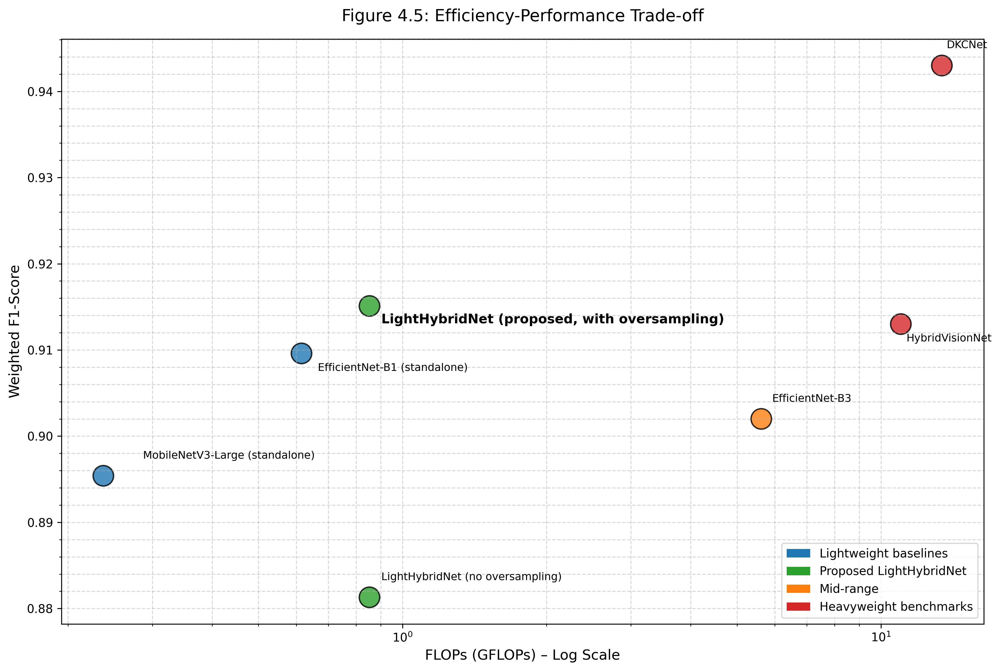

Figure saved as: figure_4_5_efficiency_performance_tradeoff_fixed_size.png


In [ ]:
import matplotlib.pyplot as plt

models = [
    "MobileNetV3-Large (standalone)",
    "EfficientNet-B1 (standalone)",
    "LightHybridNet (no oversampling)",
    "LightHybridNet (proposed, with oversampling)",
    "EfficientNet-B3",
    "HybridVisionNet",
    "DKCNet"
]

flops = [0.237, 0.615, 0.853, 0.853, 5.62, 11, 13.4]           # GFLOPs
f1_scores = [0.8954, 0.9096, 0.8813, 0.9151, 0.902, 0.913, 0.943]  # Weighted F1

# Categories for coloring
categories = ["light", "light", "hybrid", "hybrid", "mid", "heavy", "heavy"]

# Colors
colors = []
for cat in categories:
    if cat == "light":
        colors.append('#1f77b4')  
    elif cat == "hybrid":
        colors.append('#2ca02c')  
    elif cat == "mid":
        colors.append('#ff7f0e')   
    else:
        colors.append('#d62728') 

# Create figure
plt.figure(figsize=(12, 8), dpi=300)

# Fixed bubble size (same for all)
bubble_size = 300

# Scatter plot
plt.scatter(flops, f1_scores, s=bubble_size, c=colors, alpha=0.8, edgecolors='black', linewidth=1.2)

# Add labels with slight offset to avoid overlap
for i, model in enumerate(models):
    x_offset = 0.05 if flops[i] < 1 else 0.3       
    y_offset = 0.002 if i % 2 == 0 else -0.002
    if "proposed" in model:
        plt.text(flops[i] + x_offset, f1_scores[i] + y_offset, model,
                 fontsize=11, fontweight='bold', color='black')
    else:
        plt.text(flops[i] + x_offset, f1_scores[i] + y_offset, model,
                 fontsize=9, color='black')

# Log scale on x-axis
plt.xscale('log')
plt.xlabel('FLOPs (GFLOPs) – Log Scale', fontsize=12)
plt.ylabel('Weighted F1-Score', fontsize=12)
plt.title('Figure 4.5: Efficiency-Performance Trade-off', fontsize=14, pad=15)

# Grid
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.minorticks_on()

# Legend for categories
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#1f77b4', label='Lightweight baselines'),
    Patch(facecolor='#2ca02c', label='Proposed LightHybridNet'),
    Patch(facecolor='#ff7f0e', label='Mid-range'),
    Patch(facecolor='#d62728', label='Heavyweight benchmarks')
]
plt.legend(handles=legend_elements, loc='lower right', fontsize=10, frameon=True)

# Final touches
plt.tight_layout()

plt.savefig('figure_4_5_efficiency_performance_tradeoff_fixed_size.png', dpi=300, bbox_inches='tight')
plt.show()

print("Figure saved as: figure_4_5_efficiency_performance_tradeoff_fixed_size.png")

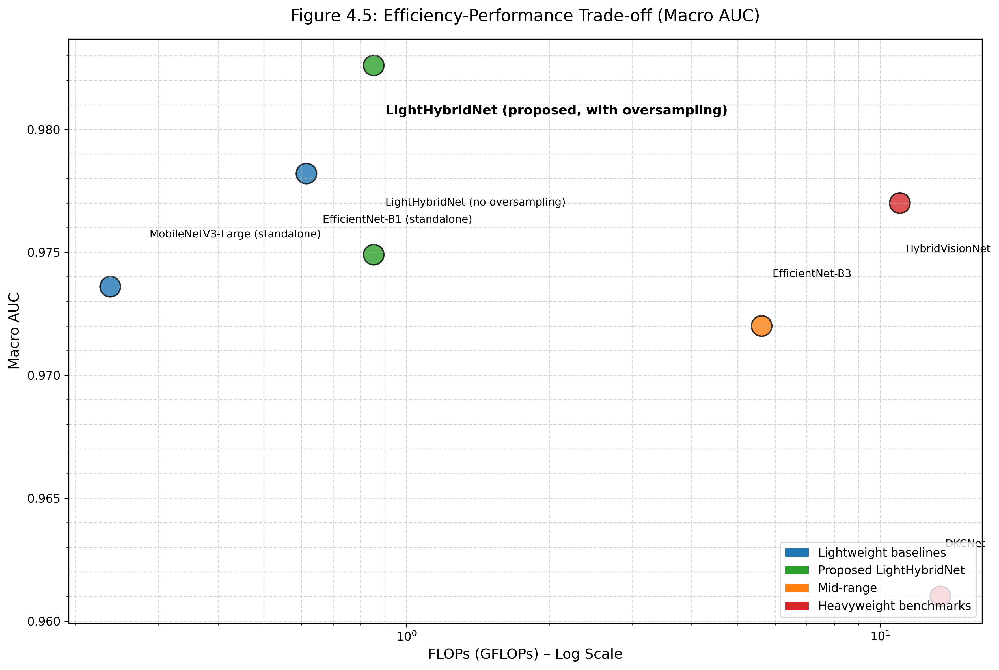

Figure saved as: figure_4_5_efficiency_performance_tradeoff_macro_auc_fixed_size.png


In [ ]:
import matplotlib.pyplot as plt

models = [
    "MobileNetV3-Large (standalone)",
    "EfficientNet-B1 (standalone)",
    "LightHybridNet (no oversampling)",
    "LightHybridNet (proposed, with oversampling)",
    "EfficientNet-B3",
    "HybridVisionNet",
    "DKCNet"
]

flops = [0.237, 0.615, 0.853, 0.853, 5.62, 11, 13.4]          
macro_auc = [0.9736, 0.9782, 0.9749, 0.9826, 0.972, 0.977, 0.961]  

# Categories for coloring
categories = ["light", "light", "hybrid", "hybrid", "mid", "heavy", "heavy"]

# Colors
colors = []
for cat in categories:
    if cat == "light":
        colors.append('#1f77b4')    
    elif cat == "hybrid":
        colors.append('#2ca02c')    
    elif cat == "mid":
        colors.append('#ff7f0e') 
    else:
        colors.append('#d62728') 

# Create figure
plt.figure(figsize=(12, 8), dpi=300)

# Fixed bubble size
bubble_size = 300

# Scatter plot
plt.scatter(flops, macro_auc, s=bubble_size, c=colors, alpha=0.8, edgecolors='black', linewidth=1.2)

# Add labels with slight offset to avoid overlap
for i, model in enumerate(models):
    x_offset = 0.05 if flops[i] < 1 else 0.3       
    y_offset = 0.002 if i % 2 == 0 else -0.002    
    if "proposed" in model:
        plt.text(flops[i] + x_offset, macro_auc[i] + y_offset, model,
                 fontsize=11, fontweight='bold', color='black')
    else:
        plt.text(flops[i] + x_offset, macro_auc[i] + y_offset, model,
                 fontsize=9, color='black')

# Log scale on x-axis (wide FLOPs range)
plt.xscale('log')
plt.xlabel('FLOPs (GFLOPs) – Log Scale', fontsize=12)
plt.ylabel('Macro AUC', fontsize=12)
plt.title('Figure 4.5: Efficiency-Performance Trade-off (Macro AUC)', fontsize=14, pad=15)

# Grid
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.minorticks_on()

# Legend for categories
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#1f77b4', label='Lightweight baselines'),
    Patch(facecolor='#2ca02c', label='Proposed LightHybridNet'),
    Patch(facecolor='#ff7f0e', label='Mid-range'),
    Patch(facecolor='#d62728', label='Heavyweight benchmarks')
]
plt.legend(handles=legend_elements, loc='lower right', fontsize=10, frameon=True)

# Final touches
plt.tight_layout()

plt.savefig('figure_4_5_efficiency_performance_tradeoff_macro_auc_fixed_size.png', dpi=300, bbox_inches='tight')
plt.show()

print("Figure saved as: figure_4_5_efficiency_performance_tradeoff_macro_auc_fixed_size.png")